# DATA SCIENCE SESSIONS VOL. 3
### A Foundational Python Data Science Course
## Session 13: Simple Linear Regression. Estimation Theory continued: the Parametric bootstrap.

[&larr; Back to course webpage](https://datakolektiv.com/)

Feedback should be send to [goran.milovanovic@datakolektiv.com](mailto:goran.milovanovic@datakolektiv.com). 

These notebooks accompany the DATA SCIENCE SESSIONS VOL. 3 :: A Foundational Python Data Science Course.

### Lecturers

[Goran S. Milovanović, PhD, DataKolektiv, Chief Scientist & Owner](https://www.linkedin.com/in/gmilovanovic/)

[Aleksandar Cvetković, PhD, DataKolektiv, Consultant](https://www.linkedin.com/in/alegzndr/)

[Ilija Lazarević, MA, DataKolektiv, Consultant](https://www.linkedin.com/in/ilijalazarevic/)

***

# **Simple Linear Regression: Fitting the Model**

## **Understanding the Formula**
The linear regression equation is:

\[
Y = b_0 + b_1X + \text{residual}
\]

Where:  
- \( Y \) = Dependent variable (target)  
- \( X \) = Independent variable (input)  
- \( b_0 \) = Intercept  
- \( b_1 \) = Slope (coefficient)  
- Residual = Difference between actual and predicted \( Y \) values  

## **Why and When Do We "Fit" the Model?**
### **Why Fit the Model?**  
- To find the best values for \( b_0 \) and \( b_1 \) that minimize the error between predicted \( Y \) and actual \( Y \).  
- The goal is to minimize the **residuals** (errors).

### **When to Fit the Model?**  
- When you **train the model** using historical data where both \( X \) and \( Y \) are known.  
- Before making predictions, the model must "learn" the best values of \( b_0 \) and \( b_1 \).  
- When updating a model with new data, it may need to be **refitted** for better accuracy.  

## **How Does Fitting Work?**
- **Ordinary Least Squares (OLS)** is used to minimize the sum of squared residuals:

  \[
  \sum (y_i - \hat{y}_i)^2
  \]

- The best values of **\( b_0 \) (intercept)** and **\( b_1 \) (slope)** are calculated to reduce the error.

## **What Happens After Fitting?**
- Once the model is trained, we can make predictions using:

  \[
  \hat{Y} = b_0 + b_1X
  \]

- Model performance can be evaluated using:
  - **Residuals** (actual - predicted values)
  - **R² score** (how well the model explains the data)
  - **Mean Squared Error (MSE)** (average squared differences)

---

### **Next Steps: Implement in Python**

## 1. Simple Linear Regression

In [41]:
### --- Setup - importing the libraries

# - supress those annoying 'Future Warning'
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# - data
import numpy as np
import pandas as pd

# - os
import os

# - ml
import statsmodels.api as sm
import statsmodels.formula.api as smf


# - visualization
import matplotlib.pyplot as plt
import seaborn as sns

# - parameters
%matplotlib inline
pd.options.mode.chained_assignment = None  # default='warn'
sns.set_theme()
# - rng
rng = np.random.default_rng()
# - plots
plt.rc("figure", figsize=(8, 6))
plt.rc("font", size=14)
sns.set_theme(style='white')

# - directory tree
data_dir = os.path.join(os.getcwd(), '_data')
print(data_dir)

c:\Users\Admin\LUKA123452\Python Data Science - Learning Path\Lessons with Tasklists\Python13\_data


We will use the `Fish.csv` data set in this session. You can grab it from [Kaggle: fish-market](https://www.kaggle.com/datasets/aungpyaeap/fish-market). Please place the `Fish.csv` data set into your `_data` directory.

In [42]:
# - loading the dataset
# - Kaggle: https://www.kaggle.com/datasets/aungpyaeap/fish-market
# - place it in your _data/ directory
fish_data = pd.read_csv(os.path.join(data_dir, 'Fish.csv'))
fish_data.head(10)

,Species,Weight,Length1,Length2,Length3,Height,Width
0,Bream,242.0,23.2,25.4,30.0,11.5200,4.0200
1,Bream,290.0,24.0,26.3,31.2,12.4800,4.3056
2,Bream,340.0,23.9,26.5,31.1,12.3778,4.6961
3,Bream,363.0,26.3,29.0,33.5,12.7300,4.4555
4,Bream,430.0,26.5,29.0,34.0,12.4440,5.1340
5,Bream,450.0,26.8,29.7,34.7,13.6024,4.9274
6,Bream,500.0,26.8,29.7,34.5,14.1795,5.2785
7,Bream,390.0,27.6,30.0,35.0,12.6700,4.6900
8,Bream,450.0,27.6,30.0,35.1,14.0049,4.8438
9,Bream,500.0,28.5,30.7,36.2,14.2266,4.9594


In [43]:
fish_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Species  159 non-null    object 
 1   Weight   159 non-null    float64
 2   Length1  159 non-null    float64
 3   Length2  159 non-null    float64
 4   Length3  159 non-null    float64
 5   Height   159 non-null    float64
 6   Width    159 non-null    float64
dtypes: float64(6), object(1)
memory usage: 8.8+ KB


### Target: predict Weight from Height

In [44]:
model_frame = fish_data[['Height', 'Weight']]
model_frame

,Height,Weight
0,11.5200,242.0
1,12.4800,290.0
2,12.3778,340.0
3,12.7300,363.0
4,12.4440,430.0
...,...,...
154,2.0904,12.2
155,2.4300,13.4
156,2.2770,12.2
157,2.8728,19.7


In [45]:
# - fitting the linear model to the data
linear_model = smf.ols(formula='Weight ~ Height', data=model_frame).fit()
linear_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Weight   R-squared:                       0.525
Model:                            OLS   Adj. R-squared:                  0.522
Method:                 Least Squares   F-statistic:                     173.3
Date:                Sun, 23 Mar 2025   Prob (F-statistic):           3.84e-27
Time:                        18:27:01   Log-Likelihood:                -1101.0
No. Observations:                 159   AIC:                             2206.
Df Residuals:                     157   BIC:                             2212.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -144.3860     45.663     -3.162      0.002    -234.579     -54.193
Height        60.4964      4.595     13.164      0.000      51.419      69.573
==============================================================================
Omnibus:                       95.711   Durbin-Watson:                   0.279
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              482.586
Skew:                           2.288   Prob(JB):                    1.61e-105
Kurtosis:                      10.204   Cond. No.                         23.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# **OLS Regression Results: Understanding the Output**

After running:

```python
linear_model = smf.ols(formula='Weight ~ Height', data=model_frame).fit()
linear_model.summary()



---

## **Key Takeaways from the Output**

### **1. Model Fit (How well does the model explain the data?)**
- **R-squared: 0.525**  
  - The model explains **52.5% of the variance** in `Weight` using `Height`.  
  - This indicates a **moderate relationship**.  

- **Adjusted R-squared: 0.522**  
  - Adjusted R² accounts for the number of predictors (useful for multiple regression).  

- **F-statistic: 173.3, p-value: 3.84e-27**  
  - The model is **statistically significant** (p < 0.05).  
  - This means `Height` significantly predicts `Weight`.  

---

### **2. Regression Coefficients (Intercept & Slope)**
| Variable   | Coefficient | Std. Error | t-statistic | p-value  | Confidence Interval (95%) |
|------------|------------|------------|------------|------------|----------------|
| **Intercept** | -144.3860 | 45.663 | -3.162 | 0.002 | [-234.579, -54.193] |
| **Height**   | 60.4964  | 4.595  | 13.164  | 0.000 | [51.419, 69.573] |

- **Intercept (-144.3860)**  
  - If `Height = 0`, the predicted `Weight` would be **-144.39** (not meaningful in real life).  

- **Slope (60.4964)**  
  - For **each 1-unit increase** in `Height`, `Weight` increases by **60.50** on average.  
  - The p-value (0.000) is **very small**, confirming `Height` is a significant predictor.  

---

### **3. Residual Diagnostics (Are the assumptions of linear regression met?)**
- **Durbin-Watson: 0.279**  
  - A **low value (< 2)** suggests **positive autocorrelation** (residuals are correlated).  

- **Skew (2.288) & Kurtosis (10.204)**  
  - Residuals are **not normally distributed** (high skew & kurtosis).  

- **Jarque-Bera (JB) Test (p = 1.61e-105)**  
  - A **very low p-value** confirms **significant deviation from normality** in residuals.  

---

## **Final Thoughts**
- The model explains about **52.5% of the variance in Weight** using `Height` as a predictor.  
- `Height` is **statistically significant** in predicting `Weight` (p < 0.05).  
- However, **residuals are not normally distributed**, which suggests a potential need for:  
  - **Transformations (log, square root, etc.)**  
  - **Using a different regression model**  

---

Linear model has the form

$$y = \beta_1 x + \beta_0 + \varepsilon,$$

where
- $y$ - the true value of the *target variable*
- $\beta_1$ - the *slope* of the model
- $\beta_0$ - the *intercept* of the model
- $\varepsilon$ - the *residual*

The predicted value $\hat{y}$ of the target variable is computed via Liner regression via

$$\hat{y} = \beta_1 x + \beta_0.$$

# - model's parameters; Height represent the slope k
linear_model.params

In [46]:
# - predicting the value using model's formula and parameters
model_frame['Predicted Values'] = linear_model.predict()

In [47]:
# - calculating the residuals - the difference between the true and predicted values
model_frame['Residuals'] = linear_model.resid

In [48]:
model_frame

,Height,Weight,Predicted Values,Residuals
0,11.5200,242.0,552.531995,-310.531995
1,12.4800,290.0,610.608492,-320.608492
2,12.3778,340.0,604.425765,-264.425765
3,12.7300,363.0,625.732580,-262.732580
4,12.4440,430.0,608.430623,-178.430623
...,...,...,...,...
154,2.0904,12.2,-17.924399,30.124399
155,2.4300,13.4,2.620162,10.779838
156,2.2770,12.2,-6.635779,18.835779
157,2.8728,19.7,29.407947,-9.707947


In [49]:
# - some statistics on the residuals
model_frame['Residuals'].describe()

count    1.590000e+02
mean    -5.720092e-14
std      2.468036e+02
min     -3.572937e+02
25%     -1.165323e+02
50%     -7.076091e+01
75%      3.391263e+01
max      1.163621e+03
Name: Residuals, dtype: float64

### For the code below, in the regplot:

ci stands for confidence interval

- confidence interval is a range of values that is likely to contain a population parameter with a certain level of confidence.

- if a confidence interval contains zero then we would say there is strong evidence that there is not a ‘significant’ difference between the two population means

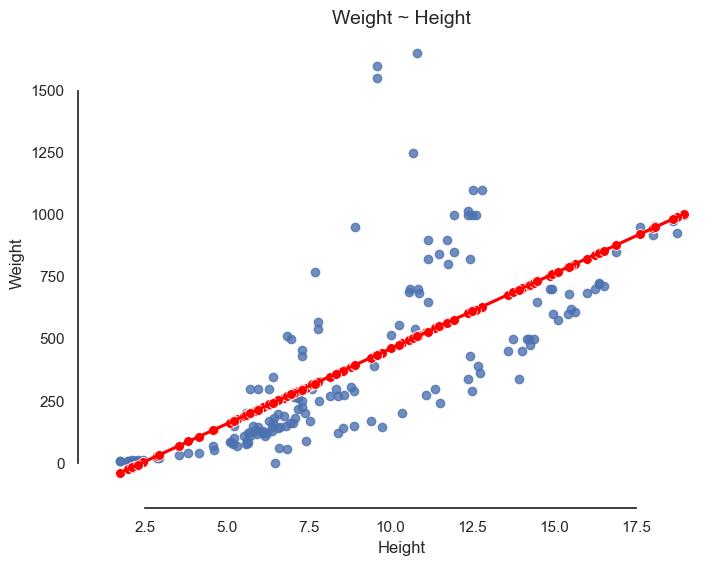

In [50]:
# - plotting the true data, predicted values and the prediction line
sns.regplot(data=model_frame, x='Height', y='Weight', ci=0, line_kws={'color':'red'})
sns.scatterplot(data=model_frame, x='Height', y='Predicted Values', color='red', s=50)
sns.despine(offset=10, trim=True)
plt.title('Weight ~ Height', fontsize=14);

Ok, `statsmodels` can do it; how do we find out about the optimal values of $\beta_0$ and $\beta_1$?
Let's build ourselves a function that (a) tests for some particular values of $\beta_0$ and $\beta_1$ for a particular regression problem (i.e. for a particular dataset) and returns the model error.

The model error? Oh. Remember the residuals:

$$\epsilon_i = y_i - \hat{y_i}$$

where $y_i$ is the observation to be predicted, and $\hat{y_i}$ the actual prediction?

Next we do something similar to what happens in the computation of variance, square the differences:

$$\epsilon_i^2 = (y_i - \hat{y_i})^2$$

and define the model error for all observations to be **the sum of squares**:

$$SSE = \sum_{i=1}^{N}(y_i - \hat{y_i})^2$$

Obviously, the lower the $SSE$ - the Sum of Squared Error - the better the model! Here's a function that returns the SSE for a given data set (with two columns: the predictor and the criterion) and a choice of parameters $\beta_0$ and $\beta_1$:

In [51]:
# - sse function

def lg_sse(pars):
    # pick up the parameters
    beta_0 = pars[0]
    beta_1 = pars[1]
    # predict from the parameters
    pred = beta_0 + beta_1*fish_data['Height']
    # compute the residuals
    residuals = fish_data['Weight'] - pred
    # square the residuals
    residuals = residuals**2
    # sum of squares
    residuals = residuals.sum()
    # out
    return residuals

Test `lg_sse()` now:

In [52]:
pars = [-144.385971, 60.496351]
print(lg_sse(pars))

9624100.07729549


Check via `statsmodels`:

In [53]:
(linear_model.resid**2).sum()

9624100.07729549

Method A. Random parameter space search

In [54]:
beta_0 = np.random.uniform(low=-200, high=200, size=1000)
beta_1 = np.random.uniform(low=-200, high=200, size=1000)
random_pars = pd.DataFrame({'beta_0':beta_0,'beta_1':beta_1})
random_pars.head(5)


,beta_0,beta_1
0,91.143444,116.517075
1,-175.071588,-11.790232
2,-97.310615,-73.185254
3,-193.120145,-23.266227
4,139.698332,-109.103982


We have a func. lg_sse(params) which returns the residual of the given params 

Here, the `for` loop iterates through the rows of random pars generated and beta_0 and beta_1 are passed to lg_sse functions and appended to

the empty list sse = []

In [55]:
sse = []
for i in range(random_pars.shape[0]):
    pars = [random_pars['beta_0'][i],random_pars['beta_1'][i]]
    sse.append(lg_sse(pars))
random_pars['sse'] = sse
random_pars.sort_values('sse', ascending=True, inplace=True)
random_pars.head()
random_pars

,beta_0,beta_1,sse
193,-182.387720,62.860056,9.685178e+06
205,-197.546738,66.732927,9.738236e+06
325,-57.343464,52.696320,9.847024e+06
478,-193.627472,61.526789,9.881550e+06
108,-110.500446,53.376817,9.914177e+06
...,...,...,...
352,-61.268206,-198.035628,9.987109e+08
224,-170.605287,-188.180769,9.991542e+08
956,-146.982299,-192.067146,1.012898e+09
796,-105.449136,-198.001055,1.030162e+09


Check with `statsmodels`:

In [37]:
linear_model.params

Intercept   -144.385971
Height        60.496351
dtype: float64

Not bad, how about 100,000 random pairs?

In [38]:
beta_0 = np.random.uniform(low=-200, high=200, size=100000)
beta_1 = np.random.uniform(low=-200, high=200, size=100000)
random_pars = pd.DataFrame({'beta_0':beta_0, 'beta_1':beta_1})
sse = []
for i in range(random_pars.shape[0]):
    pars = [random_pars['beta_0'][i],random_pars['beta_1'][i]]
    sse.append(lg_sse(pars))
random_pars['sse'] = sse
random_pars.sort_values('sse', ascending=True, inplace=True)
random_pars.head()

KeyboardInterrupt: 

Method B. Grid search

In [39]:
beta_0_vals = np.linspace(-200,200,100)
beta_1_vals = np.linspace(-200,200,100)
grid = np.array([(beta_0, beta_1) for beta_0 in beta_0_vals for beta_1 in beta_1_vals])
grid = pd.DataFrame(grid)
grid = grid.rename(columns={0: "beta_0", 1: "beta_1"})
grid.head()

,beta_0,beta_1
0,-200.0,-200.000000
1,-200.0,-195.959596
2,-200.0,-191.919192
3,-200.0,-187.878788
4,-200.0,-183.838384


In [56]:
sse = []
for i in range(grid.shape[0]):
    pars = [grid['beta_0'][i],grid['beta_1'][i]]
    sse.append(lg_sse(pars))
grid['sse'] = sse
grid.sort_values('sse', ascending=True, inplace=True)
grid.head(5)

,beta_0,beta_1,sse
13664,-146.331658,52.864322,9.624101e+06
23659,-136.281407,51.859296,9.624102e+06
23660,-136.281407,52.060302,9.624113e+06
2868,-157.185930,53.668342,9.624117e+06
26135,-133.869347,67.135678,9.624137e+06


A grid more dense:

In [41]:
beta_0_vals = np.linspace(-200,200,1000)
beta_1_vals = np.linspace(-200,200,1000)
grid = np.array([(beta_0, beta_1) for beta_0 in beta_0_vals for beta_1 in beta_1_vals])
grid = pd.DataFrame(grid)
grid = grid.rename(columns={0: "beta_0", 1: "beta_1"})
sse = []
for i in range(grid.shape[0]):
    pars = [grid['beta_0'][i],grid['beta_1'][i]]
    sse.append(lg_sse(pars))
grid['sse'] = sse
grid.sort_values('sse', ascending=True, inplace=True)
grid.head()

KeyboardInterrupt: 

Check with `statsmodels`:

In [57]:
linear_model.params

Intercept   -144.385971
Height        60.496351
dtype: float64

Method C. Optimization (the real thing)

The Method of Least Squares

Here is the real thing. 

- **Question.** What do we really need to do to find the optimal $\beta_0$, $\beta_1$ parameters of the Simple Linear Regression Model?
- **Answer.** Of course, we need to find $\beta_0$, $\beta_1$ **at the minimum of the $SSE$ - the error - function.**

And how do we do that?

Well, in a particular case of a (Simple or Multiple) Linear Regression Model, it turns out that is possible to provide an analytical solution for all model parameteres that minimize the model $SSE$ (error) function. It takes some time work through the partial derivates of $SSE$ in respect to each model parameter, but it works in the end.

*But finding analytical solutuion will not work for just any statistical model.*

Now, imagine that we have an algorithm - call it an **optimization algorithm ** - that can find the parameters that minimize a respective function. Indeed we have such an algorithm. Indeed we have many different such algorithms, developed by experts in the very, very alive and complicated branch of mathematics called Optimization Theory. We will put one such algorithm - the 

famed Nelder-Mead Simplex Method - to work in order to minimize $SSE$ in respect to $\beta_0$, $\beta_1$.

In [58]:
import scipy as sp
import numpy as np

# - sse function
def lg_sse(pars, data):
    # - pick up the parameters
    beta_0 = pars[0]
    beta_1 = pars[1]
    # - predict from parameters
    preds = beta_0 + beta_1 * data['Height']
    # - compute residuals
    residuals = data['Weight'] - preds
    # - square the residuals
    residuals = residuals**2
    # - sum of squares
    return residuals.sum()

# - initial (random) parameter values
init_beta_0 = float(np.random.uniform(low=-15, high=15, size=1))
init_beta_1 = float(np.random.uniform(low=-15, high=15, size=1))
init_pars = np.array([init_beta_0, init_beta_1])

# - optimize w. Nelder-Mead
optimal_model = sp.optimize.minimize(
    fun=lg_sse,
    args=(fish_data,),  # Ensure it's a tuple
    x0=init_pars,
    method='Nelder-Mead'
)

# - optimal parameters
print(optimal_model.x)


[-144.38595717   60.49635139]


C:\Users\Admin\AppData\Local\Temp\ipykernel_6720\3388582011.py:19: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\Admin\AppData\Local\Temp\ipykernel_6720\3388582011.py:20: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



Final value of the objective function (the model SSE, indeed):

In [59]:
lg_sse(pars=optimal_model.x, data=fish_data)

9624100.07729553

Error Surface Plot: The Objective Function

In [12]:
beta_0_vals = np.linspace(-160,-120,200)
beta_1_vals = np.linspace(40,80,200)
grid = np.array([(beta_0, beta_1) for beta_0 in beta_0_vals for beta_1 in beta_1_vals])
grid = pd.DataFrame(grid)
grid = grid.rename(columns={0: "beta_0", 1: "beta_1"})
sse = []
for i in range(grid.shape[0]):
    pars = [grid['beta_0'][i],grid['beta_1'][i]]
    sse.append(lg_sse(pars, fish_data))
grid['sse'] = sse
grid.sort_values('sse', ascending=True, inplace=True)
grid.head()

,beta_0,beta_1,sse
15502,-144.522613,60.502513,9.624101e+06
15702,-144.321608,60.502513,9.624102e+06
15302,-144.723618,60.502513,9.624113e+06
15902,-144.120603,60.502513,9.624117e+06
15102,-144.924623,60.502513,9.624137e+06


This the function that we have minimized:

In [60]:
# - import plotly
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "notebook" 
# - Mesh3d: Objective Function
fig = go.Figure(data=[go.Mesh3d(
    x=grid['beta_0'], 
    y=grid['beta_1'], 
    z=grid['sse'], 
    color='lightblue', 
    opacity=0.50)])
fig.update_layout(scene = dict(
                    xaxis_title='Beta_0',
                    yaxis_title='Beta_1',
                    zaxis_title='SSE'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10))
fig.show()

Back to statsmodels

In [61]:
# - Pearson's correlation (R-value) coefficient and R^2
print(f"Pearson's correlation (R-value): {round(np.sqrt(linear_model.rsquared), 4)}")
print(f"Coefficient of determination (R^2): {round(linear_model.rsquared, 4)}")

Pearson's correlation (R-value): 0.7243
Coefficient of determination (R^2): 0.5247


In [18]:
# - p-values of the model's parameters
print(f"p-values: \n{linear_model.pvalues}")

p-values: 
Intercept    1.881076e-03
Height       3.842342e-27
dtype: float64


In [35]:
# --- Predicting new data

predictions = pd.DataFrame(columns=['Height', 'Weight'])

# - sampling the new data from the normal distribution with the mean and std parameters taken from the original data
new_fish_height = rng.normal(loc=model_frame['Height'].mean(), scale=model_frame['Height'].std(), size=100)
# - clipping the negative values 
new_fish_height = np.clip(new_fish_height, a_min=0, a_max=np.infty)
predictions['Height'] = new_fish_height

# - predicting the heights on the new data using the linear model
new_fish_weight = linear_model.predict(predictions['Height'])

# - displaying the new data and the corresponding predictions
predictions['Weight'] = new_fish_weight
print(predictions)

       Height      Weight
0    1.380195  -60.889184
1    0.000000 -144.385971
2   13.383582  665.271933
3    5.652574  197.574105
4    4.894279  151.700041
..        ...         ...
95   7.780094  326.281304
96  11.330290  541.055252
97  10.809531  509.551238
98   8.309796  358.326340
99  13.395043  665.965258

[100 rows x 2 columns]


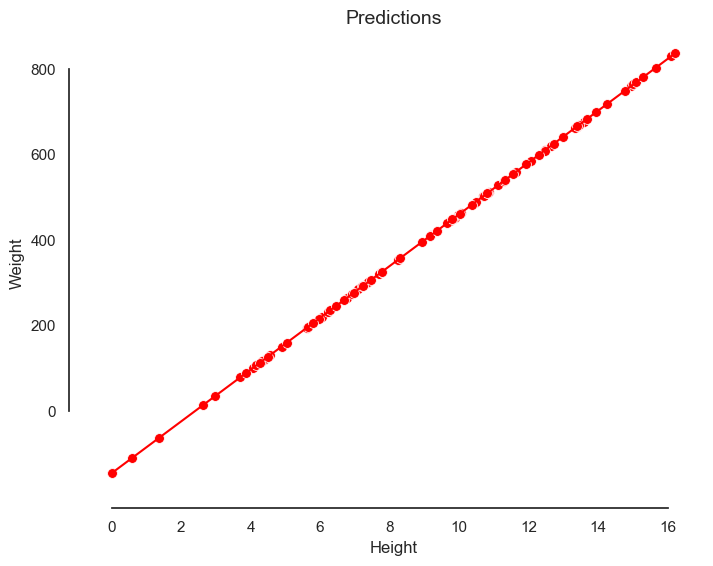

In [36]:
# - plotting the predictions
sns.lineplot(data=predictions, x='Height', y='Weight', color='red')
sns.scatterplot(data=predictions, x='Height', y='Weight', color='red', s=50)
sns.despine(offset=10, trim=True)
plt.title('Predictions', fontsize=14);

In [65]:
# R^2 upacked - calculating R^2 using the corresponding formulas
total_sse = np.sum((model_frame['Weight'] - model_frame['Weight'].mean())**2)
model_sse = np.sum((model_frame['Predicted Values'] - model_frame['Weight'].mean())**2)
residual_sse = np.sum(model_frame['Residuals']**2)

print(np.isclose(total_sse, model_sse + residual_sse))

True


In [63]:
# - calculating R^2 from the correlation 
r2 = model_frame['Height'].corr(model_frame['Weight'])**2
print(f"r2 = {r2}\n")

# - or 
corr_matrix = np.corrcoef(model_frame['Height'], model_frame['Weight'])**2
print(corr_matrix, '\n')
r2 = corr_matrix[0, 1]
print(f"r2 = {r2}")

r2 = 0.5246761559328885

[[1.         0.52467616]
 [0.52467616 1.        ]] 

r2 = 0.5246761559328885


In [66]:
# - yet another way to calculate R^2
model_sse/total_sse

0.5246761559328881

In [67]:
# - correlation is the covariance of the scaled variables!

# - scaling the variables
x = (model_frame['Height'] - model_frame['Height'].mean())/model_frame['Height'].std()
y = (model_frame['Weight'] - model_frame['Weight'].mean())/model_frame['Weight'].std()

# - calculating the covariance
cov_matrix = np.cov(x, y)
cov = cov_matrix[0, 1]
print('cov.: ', cov)
print('R^2 = cov.^2: ', cov**2)

cov.:  0.7243453291993319
R^2 = cov.^2:  0.5246761559328885


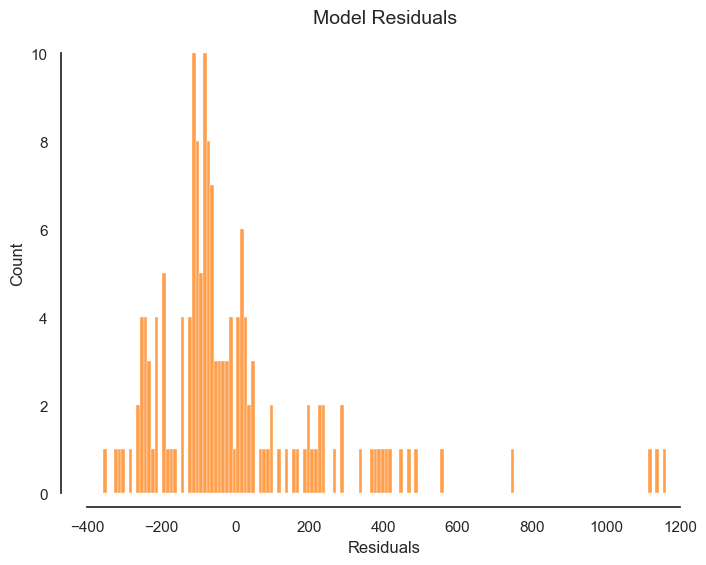

In [68]:
# - plotting the distribution of the residuals
plt.figure(figsize=(8, 6))
sns.histplot(data=model_frame, x='Residuals', binwidth=10, color='tab:orange')
sns.despine(offset=10, trim=True)
plt.title('Model Residuals', fontsize=14);

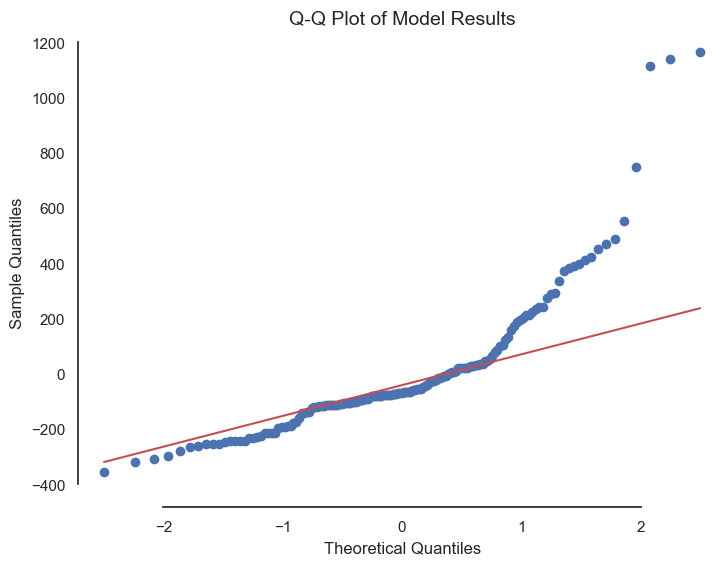

In [69]:
# - plotting the qqplot
sm.qqplot(model_frame['Residuals'].values, line='q')
sns.despine(offset=10, trim=True)
plt.title('Q-Q Plot of Model Results', fontsize=14);

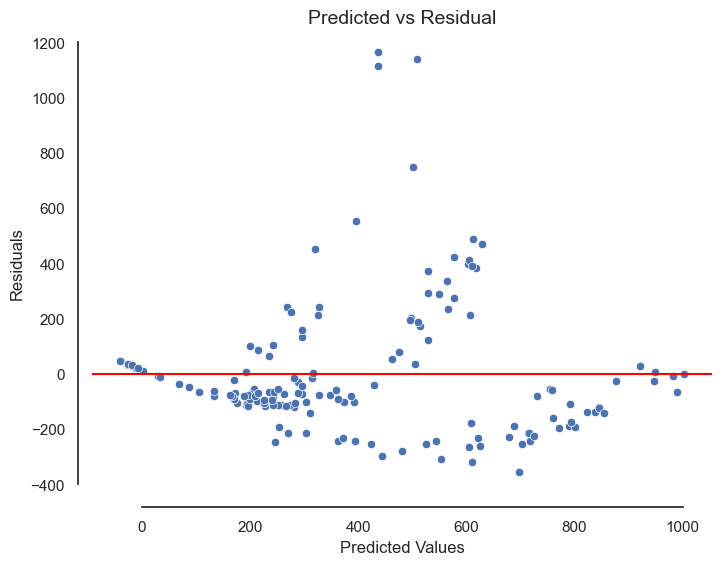

In [70]:
### --- Heteroskedacity

# - plotting the predicted values vs the residuals
plt.figure(figsize=(8, 6))
sns.scatterplot(data=model_frame, x='Predicted Values', y='Residuals')
sns.despine(offset=10, trim=True)
plt.axhline(y=0, color='red')
plt.title('Predicted vs Residual', fontsize=14);

In [84]:
# - identifying the influental cases
model_inf = linear_model.get_influence()
inf_frame = model_inf.summary_frame()
inf_frame


,dfb_Intercept,dfb_Height,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,0.010916,-0.059963,0.006823,-1.259609,0.008528,-0.116819,-1.261984,-0.117039
1,0.032398,-0.085427,0.009019,-1.301798,0.010531,-0.134302,-1.304707,-0.134602
2,0.024818,-0.068269,0.005990,-1.073542,0.010288,-0.109452,-1.074067,-0.109506
3,0.031016,-0.074907,0.006424,-1.067137,0.011157,-0.113353,-1.067612,-0.113404
4,0.017523,-0.046875,0.002770,-0.724468,0.010445,-0.074430,-0.723367,-0.074317
...,...,...,...,...,...,...,...,...
154,0.018540,-0.015848,0.000175,0.123070,0.022599,0.018714,0.122683,0.018655
155,0.006371,-0.005382,0.000021,0.044004,0.021029,0.006449,0.043864,0.006429
156,0.011339,-0.009632,0.000066,0.076917,0.021726,0.011463,0.076673,0.011426
157,-0.005431,0.004510,0.000015,-0.039590,0.019101,-0.005525,-0.039464,-0.005507


In [85]:
### --- Influence Measures

# - calculating the Cook's distance /Cook and Weisberg (1982)/
# - consider values with Cook's distance greater than 1 to be problematic

w_cookD = np.argwhere(model_inf.cooks_distance[0] > 1)
w_cookD

array([], shape=(0, 1), dtype=int64)

In [73]:
# - Leverage: hat values
# - Average Leverage = (k+1)/n
# - k - num. of predictors
# - n - num. observations
# - Also termed: hat values, range: 0 - 1
# - Various criteria (twice the average leverage, three times the average leverage...)

k = 1
n = len(model_frame)
w_leverage = np.argwhere(model_inf.hat_matrix_diag > 2*(k+1)/n)
w_leverage

array([[27],
       [28],
       [29],
       [30],
       [31],
       [32],
       [33],
       [34]], dtype=int64)

In [74]:
# - influence plot
inf_plot_frame = pd.DataFrame(columns=['Residuals', 'Leverage', 'Cook Dist.'])

inf_plot_frame['Residuals'] = model_frame['Residuals']
inf_plot_frame['Leverage'] = model_inf.hat_matrix_diag
inf_plot_frame['Cook Dist.'] = model_inf.cooks_distance[0]

inf_plot_frame

,Residuals,Leverage,Cook Dist.
0,-310.531995,0.008528,0.006823
1,-320.608492,0.010531,0.009019
2,-264.425765,0.010288,0.005990
3,-262.732580,0.011157,0.006424
4,-178.430623,0.010445,0.002770
...,...,...,...
154,30.124399,0.022599,0.000175
155,10.779838,0.021029,0.000021
156,18.835779,0.021726,0.000066
157,-9.707947,0.019101,0.000015


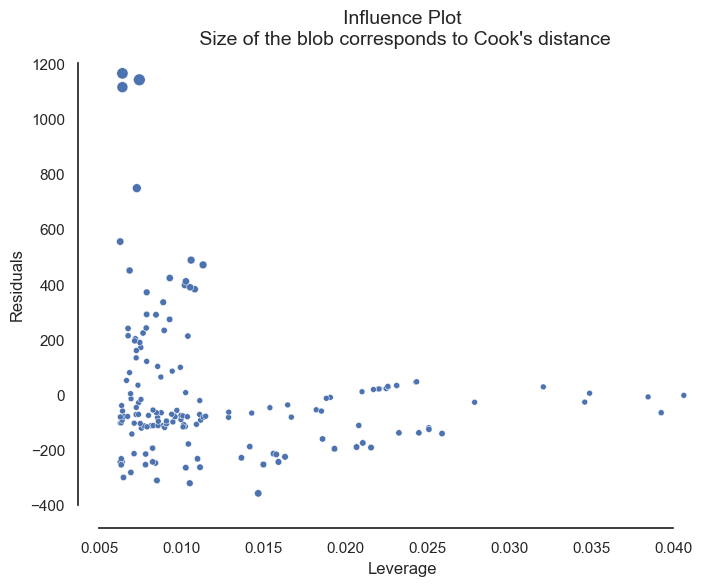

In [75]:
# - plotting the influence plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=inf_plot_frame, x='Leverage', y='Residuals', size='Cook Dist.', legend=None)
sns.despine(offset=10, trim=True)
plt.title("Influence Plot\n Size of the blob corresponds to Cook's distance", fontsize=14);

Lets put here some ChatGPT explanation for the Cook's model.

## **Influence Measures in Regression Analysis**

### **📌 1. Cook’s Distance (Detecting Outliers)**

#### 🔹 **What is Cook’s Distance?**
Cook's Distance (Cook & Weisberg, 1982) measures how **much a single data point influences** the entire regression model.  

- A **large Cook’s distance (>1)** suggests that removing that point **significantly changes** the regression results.
- Cook’s distance is based on both **leverage** and **residual size**.

#### 🔹 **How is it calculated in the code?**
```python
w_cookD = np.argwhere(model_inf.cooks_distance[0] > 1)
w_cookD
```
- **`model_inf.cooks_distance[0]`**: Extracts Cook’s distances for all observations.
- **`np.argwhere(... > 1)`**: Finds **indexes of data points** where Cook's Distance is greater than 1.
- **`w_cookD` stores these problematic points**, which could be outliers or influential observations.

---

### **📌 2. Leverage (Detecting High-Influence Points)**

#### 🔹 **What is Leverage?**
Leverage measures how **far an observation's predictor (X-value) is from the mean X**.  
- **High leverage points** have an extreme X-value and can strongly affect the regression line.
- The **average leverage** is calculated as:
  
  \[ \text{Average Leverage} = \frac{k+1}{n} \]
  
  where:
  - \( k = 1 \) (since we have one predictor, "Height").
  - \( n = \) total number of observations.

#### 🔹 **How is it calculated in the code?**
```python
k = 1
n = len(model_frame)
w_leverage = np.argwhere(model_inf.hat_matrix_diag > 2*(k+1)/n)
w_leverage
```
- **`model_inf.hat_matrix_diag`**: Extracts leverage values (hat values) for all points.
- **Threshold: `2 * (k+1)/n`**: Flags points with **twice the average leverage** as influential.
- **`w_leverage` stores the indices of these high-leverage points**.

---

### **📌 3. Influence Plot (Combining Cook's Distance & Leverage)**

#### 🔹 **What does the influence plot show?**
The influence plot is a **scatter plot of Leverage (X) vs. Residuals (Y)**, where:
- The **size of each point** represents its Cook’s Distance.
- Helps visualize **outliers** (large residuals) and **high leverage points**.

#### 🔹 **How is the influence plot data prepared?**
```python
inf_plot_frame = pd.DataFrame(columns=['Residuals', 'Leverage', 'Cook Dist.'])

inf_plot_frame['Residuals'] = model_frame['Residuals']
inf_plot_frame['Leverage'] = model_inf.hat_matrix_diag
inf_plot_frame['Cook Dist.'] = model_inf.cooks_distance[0]

inf_plot_frame
```
- Creates a DataFrame to store:
  - **Residuals** (errors between predicted & actual values).
  - **Leverage values** (how much influence a point has).
  - **Cook’s distance** (how much removing a point changes the model).

#### 🔹 **How is the influence plot visualized?**
```python
plt.figure(figsize=(8, 6))
sns.scatterplot(data=inf_plot_frame, x='Leverage', y='Residuals', size='Cook Dist.', legend=None)
sns.despine(offset=10, trim=True)
plt.title("Influence Plot\n Size of the blob corresponds to Cook's distance", fontsize=14);
```
- **`sns.scatterplot(...)`** plots:
  - X-axis = **Leverage** (identifies extreme X-values).
  - Y-axis = **Residuals** (identifies errors).
  - **Bubble size = Cook’s Distance** (larger size → more influence).
- **`sns.despine()`** removes unnecessary borders.
- **Title explains** the relationship.

---

## **🔍 Final Interpretation**
- **Points with high leverage & high residuals (large Cook's Distance)** should be **checked as potential outliers**.
- **A few large Cook’s Distance points can bias the regression model** significantly.
- **High-leverage points with small residuals are not necessarily bad**, but they **affect the model more** than others.

---

## **🚀 Summary**
| Metric | What it Measures | High Value Meaning |
|--------|-----------------|--------------------|
| **Cook’s Distance** | Influence of a point on model | Removing this point changes the model significantly |
| **Leverage** | Unusual X-value (far from mean) | This point has **high influence** on the regression line |
| **Residuals** | Difference between actual & predicted | Large residuals indicate **poor fit** |

This code **identifies influential points** that may bias the regression results. If Cook’s distance and leverage are **high**, you might need to **reassess those data points** (e.g., check for errors, transformations, or alternative models).

---

Would you like to go deeper into influence diagnostics? 🚀


## Linear Regression using scikit-learn

In [87]:
from sklearn.linear_model import LinearRegression


In [88]:
# - fitting the linear model to the data
X = model_frame['Height'].values.reshape(-1, 1)
y = model_frame['Weight'].values.reshape(-1, 1)
lin_reg = LinearRegression()
lin_reg.fit(X, y)

LinearRegression()

In [89]:
# - coefficents of the model
lin_reg.coef_, lin_reg.intercept_

(array([[60.49635121]]), array([-144.38597115]))

In [90]:
# - calculating R^2 
lin_reg.score(X, y)

0.5246761559328882

In [91]:
# - predicting the weight using the model
X_pred = predictions['Height'].values.reshape(-1, 1)
y_pred = lin_reg.predict(X_pred)
y_pred[:10]

array([[ -60.88918437],
       [-144.38597115],
       [ 665.27193255],
       [ 197.57410503],
       [ 151.70004126],
       [ 266.04738073],
       [ 502.30323903],
       [ 396.83338308],
       [ 458.82964755],
       [ 677.14115035]])

In [92]:
# - comparing with the predictions from scipy's model
predictions['Weight']

0     -60.889184
1    -144.385971
2     665.271933
3     197.574105
4     151.700041
         ...    
95    326.281304
96    541.055252
97    509.551238
98    358.326340
99    665.965258
Name: Weight, Length: 100, dtype: float64

## 2. Parametric Bootstrap

### Bias and Variance via the Bootstrap

We will now begin working with **resampling methods** in statistics. 

The first resampling method that we will consider is the **Parametric Bootstrap**. It is *magic*, belive me.

Do you remember from our previous discussions of Estimation Theory what a *Bias and Variance* of a statistical estimator are?

Is there a method to estimate the Bias of a statistical estimator, at all? For example: what are the biases of $\beta_0$, $\beta_1$ in our Simple Linear Regression model?

First: the model parameters and their standard errors

In [93]:
# Get the estimated parameters and standard errors of the model
params = linear_model.params.values
stderr = linear_model.bse.values

# Print the results
print(f"Beta 0: {params[0]} (SE = {stderr[0]})")
print(f"Beta 1: {params[1]} (SE = {stderr[1]})")

Beta 0: -144.38597115478748 (SE = 45.66290399900892)
Beta 1: 60.49635121272138 (SE = 4.595454722325198)


Second: the standard deviation of model residuals

In [94]:
error_residual = np.std(linear_model.resid, ddof=1)
error_residual

246.80361789420277

Third: the Sim-Fit Loop, Parametric Bootstrap

In [ ]:
# import normal distribution from scipy
from scipy.stats import norm

# Predicted values
model_predictions = linear_model.predict()

# Define the number of bootstrap samples
n_samples = 100000

# Initialize empty arrays to store bootstrap estimates of coefficients
beta_0_samples = np.zeros(n_samples)
beta_1_samples = np.zeros(n_samples)

# Loop over the number of samples
for i in range(n_samples):

    # Use our already established model to produce new data sampless:
    # enter error_residual to model predictions 
    boostrap_predictions = model_predictions + norm.rvs(loc = 0, 
                                                        scale= error_residual, 
                                                        size = model_predictions.size)
    resampled_data = pd.DataFrame({'Height': fish_data['Height'],
                                   'Weight': boostrap_predictions})
    
    # Fit the model to the boostrap_predictions
    model_resampled = smf.ols(formula='Weight ~ Height', data=resampled_data).fit()
    
    # Store the coefficients from the resampled data
    beta_0_samples[i] = model_resampled.params.Intercept
    beta_1_samples[i] = model_resampled.params.Height

# Calculate the bias and variance of the coefficients
beta_0_bias = np.mean(beta_0_samples) - linear_model.params.Intercept
beta_1_bias = np.mean(beta_1_samples) - linear_model.params.Height
beta_0_var = np.var(beta_0_samples)
beta_1_var = np.var(beta_1_samples)

# Print the results
print(f"Beta 0: bias = {beta_0_bias}, variance = {beta_0_var}")
print(f"Beta 1: bias = {beta_1_bias}, variance = {beta_1_var}")

Compare with model parameter variances as estimated from the original Linear Regression

In [ ]:
# Print the results
print(f"Beta 0: variance = {stderr[0]**2}")
print(f"Beta 1: variance = {stderr[1]**2}")

$$\hat{Bias}_{boot} = \frac{1}{B} \sum_{r=1}^B \hat{\theta}^{*(r)} - \hat{\theta},$$

where $\hat{\theta}$ is the original estimator, $\hat{\theta}^{*(r)}$ is the estimate of $\hat{\theta}$ based on the $r$ bootstrap sample, and $B$ is the number of bootstrap samples.

Or, in a purely theoretical way, assuming that the full distribution of all possible bootstramp samples could ever be known:

$$Bias_{boot} = E_{\mathcal{F}^*}[\hat{\theta}^{*}] - \hat{\theta},$$

where $\hat{\theta}$ is the original estimator, $\hat{\theta}^{*}$ is the estimate of $\hat{\theta}$ based on a single bootstrap sample, and $E_{\mathcal{F}^*}$ denotes the expected value with respect to the distribution of bootstrap samples $\mathcal{F}^*$.

In this formula, the absence of a hat symbol above $Bias_{boot}$ indicates that this is the true bias, rather than an estimate of the bias.

### Further Reading

- [Real Python: Linear Regression in Python](https://realpython.com/linear-regression-in-python/)
- [Khan Academy: Exploring bivariate numerical data](https://www.khanacademy.org/math/statistics-probability/describing-relationships-quantitative-data)
- [Khan Academy: Advanced regression (inference and transforming)](https://www.khanacademy.org/math/statistics-probability/advanced-regression-inference-transforming)
- [Khan Academy: Statistical Inference](https://www.youtube.com/playlist?list=PLgJhDSE2ZLxaaM1W45NB8dFSQ-frJJoBq)

***

DataKolektiv, 2022/23.

[hello@datakolektiv.com](mailto:goran.milovanovic@datakolektiv.com)

![](../img/DK_Logo_100.png)

<font size=1>License: [GPLv3](https://www.gnu.org/licenses/gpl-3.0.txt) This Notebook is free software: you can redistribute it and/or modify it under the terms of the GNU General Public License as published by the Free Software Foundation, either version 3 of the License, or (at your option) any later version. This Notebook is distributed in the hope that it will be useful, but WITHOUT ANY WARRANTY; without even the implied warranty of MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE. See the GNU General Public License for more details. You should have received a copy of the GNU General Public License along with this Notebook. If not, see http://www.gnu.org/licenses/.</font>